<a href="https://colab.research.google.com/github/SanjeeveRM/Pixel-match/blob/main/PixelMatch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Author : Sanjeeve Raveenthiran Mallichetty
# Email : rm.sanjeeve@gmail.com
import numpy as np
import glob
import cv2 as cv
import cv2 
from matplotlib import pyplot as plt
from skimage.filters import median
from PIL import Image
from skimage.filters import median
import matplotlib.pyplot as plt
!pip install pixelmatch
from pixelmatch.contrib.PIL import pixelmatch
#mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/NOISYIMS.zip

Archive:  /content/drive/MyDrive/NOISYIMS.zip
   creating: THRESH/
  inflating: THRESH/00001_bw.jpg     
  inflating: THRESH/00002_bw.jpg     
  inflating: THRESH/00003_bw.jpg     
  inflating: THRESH/00004_bw.jpg     
  inflating: THRESH/00005_bw.jpg     
  inflating: THRESH/00006_bw.jpg     
  inflating: THRESH/00007_bw.jpg     
  inflating: THRESH/00008_bw.jpg     
  inflating: THRESH/00009_bw.jpg     
  inflating: THRESH/00010_bw.jpg     
  inflating: THRESH/00011_bw.jpg     
  inflating: THRESH/00012_bw.jpg     
  inflating: THRESH/00013_bw.jpg     
  inflating: THRESH/00014_bw.jpg     
  inflating: THRESH/00015_bw.jpg     
  inflating: THRESH/00016_bw.jpg     
  inflating: THRESH/00017_bw.jpg     
  inflating: THRESH/00018_bw.jpg     
  inflating: THRESH/00019_bw.jpg     
  inflating: THRESH/00020_bw.jpg     
  inflating: THRESH/00021_bw.jpg     
  inflating: THRESH/00022_bw.jpg     
  inflating: THRESH/00023_bw.jpg     
  inflating: THRESH/00024_bw.jpg     
  inflating: THRESH/0

In [ ]:
path = 'C:/Users/sonic/Downloads/all noises/g+sp+no/Positive/*.*'
img_number = 1
for file in glob.glob(path):
    print(file)
    img = cv2.imread(file,0)
    from skimage.morphology import disk
    median_using_skimage = median(img, disk(3), mode='constant', cval=0.0)
    #imgc = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    #dst = cv.fastNlMeansDenoisingColored(imgc,None,10,10,7,21)
    #cv2.imwrite("C:/Users/sonic/Downloads/all noises/test noise/temp/img1.jpg", img)
    #cv2.imwrite("C:/Users/sonic/Downloads/all noises/test noise/temp/img2.jpg", median_using_skimage)
    img1 =Image.open("C:/Users/sonic/Downloads/all noises/test noise/temp/img1.jpg")
    img2=Image.open("C:/Users/sonic/Downloads/all noises/test noise/temp/img2.jpg")
    new_size = (225, 225)
    img1 = img1.resize(new_size)
    img2 = img2.resize(new_size)

    # Pixel-wise differences between two images are stored in "img_diff."
    img_diff = Image.new("RGBA", new_size)
    mismatch = pixelmatch(img1,img2, img_diff, includeAA=True)
    print("number of mismatched pixels {}".format(mismatch))
    if mismatch < 100 and mismatch > 15:
        cv2.imwrite("C:/Users/sonic/Downloads/all noises/test noise/yes/img"+str(img_number)+".jpg", img)
    else:
        cv2.imwrite("C:/Users/sonic/Downloads/all noises/test noise/yes/img"+str(img_number)+".jpg", median_using_skimage)
    img_number +=1




In [ ]:
#noise level estimation
import numpy as np
from cv2 import imread
from skimage import img_as_float
import glob
import cv2 
import time
from PIL import Image

In [ ]:
def im2patch(im, pch_size, stride=1):
   
    if isinstance(pch_size, tuple):
        pch_H, pch_W = pch_size
    elif isinstance(pch_size, int):
        pch_H = pch_W = pch_size
    else:
        sys.exit('The input of pch_size must be a integer or a int tuple!')

    if isinstance(stride, tuple):
        stride_H, stride_W = stride
    elif isinstance(stride, int):
        stride_H = stride_W = stride
    else:
        sys.exit('The input of stride must be a integer or a int tuple!')


    C, H, W = im.shape
    num_H = len(range(0, H-pch_H+1, stride_H))
    num_W = len(range(0, W-pch_W+1, stride_W))
    num_pch = num_H * num_W
    pch = np.zeros((C, pch_H*pch_W, num_pch), dtype=im.dtype)
    kk = 0
    for ii in range(pch_H):
        for jj in range(pch_W):
            temp = im[:, ii:H-pch_H+ii+1:stride_H, jj:W-pch_W+jj+1:stride_W]
            pch[:, kk, :] = temp.reshape((C, num_pch))
            kk += 1

    return pch.reshape((C, pch_H, pch_W, num_pch))


In [ ]:
def noise_estimate(im, pch_size=8):


    if im.ndim == 3:
        im = im.transpose((2, 0, 1))
    else:
        im = np.expand_dims(im, axis=0)

    # image to patch
    pch = im2patch(im, pch_size, 3)  # C x pch_size x pch_size x num_pch tensor
    num_pch = pch.shape[3]
    pch = pch.reshape((-1, num_pch))  # d x num_pch matrix
    d = pch.shape[0]

    mu = pch.mean(axis=1, keepdims=True)  # d x 1
    X = pch - mu
    sigma_X = np.matmul(X, X.transpose()) / num_pch
    sig_value, _ = np.linalg.eigh(sigma_X)
    sig_value.sort()

    for ii in range(-1, -d-1, -1):
        tau = np.mean(sig_value[:ii])
        if np.sum(sig_value[:ii]>tau) == np.sum(sig_value[:ii] < tau):
            return np.sqrt(tau)

/content/THRESH/sandp1_6.jpg
Time: 0.0124, True Level: 5.0000, Estimated Level: 73.1011
/content/THRESH/sandp1_6.jpg


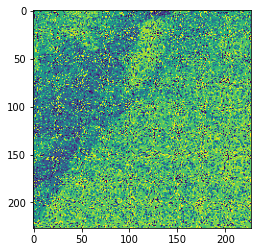

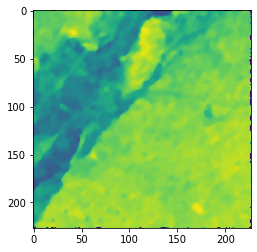

/content/THRESH/sandp1_16.jpg
Time: 0.0070, True Level: 5.0000, Estimated Level: 72.3135
/content/THRESH/sandp1_16.jpg


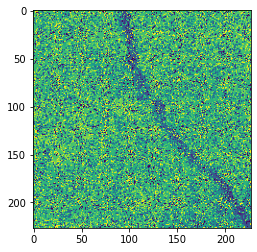

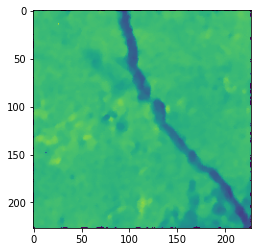

/content/THRESH/00014_bw.jpg
Time: 0.0079, True Level: 5.0000, Estimated Level: 16.4286
/content/THRESH/00014_bw.jpg


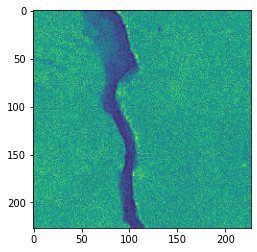

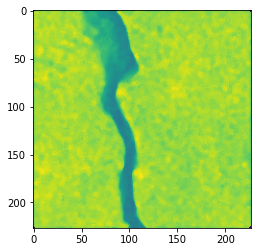

/content/THRESH/00006_bw.jpg
Time: 0.0237, True Level: 5.0000, Estimated Level: 16.3526
/content/THRESH/00006_bw.jpg


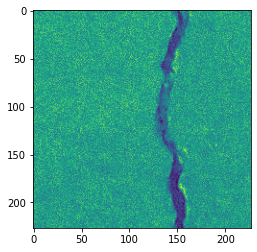

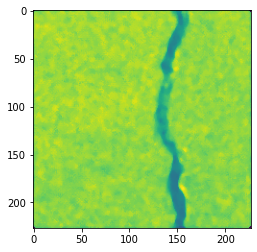

/content/THRESH/00007_bw.jpg
Time: 0.0088, True Level: 5.0000, Estimated Level: 14.2603
/content/THRESH/00007_bw.jpg


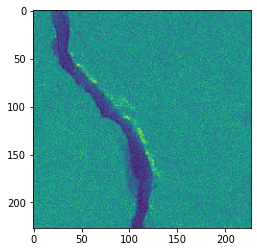

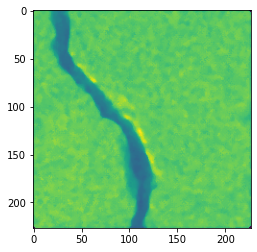

/content/THRESH/00016_bw.jpg
Time: 0.0073, True Level: 5.0000, Estimated Level: 16.4460
/content/THRESH/00016_bw.jpg


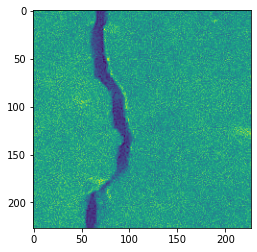

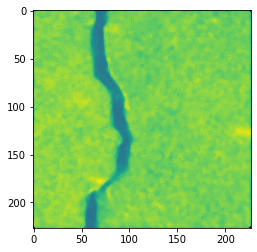

/content/THRESH/sandp1_25.jpg
Time: 0.0112, True Level: 5.0000, Estimated Level: 72.5949
/content/THRESH/sandp1_25.jpg


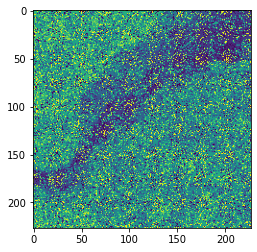

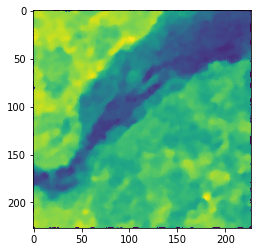

/content/THRESH/00005_bw.jpg
Time: 0.0079, True Level: 5.0000, Estimated Level: 17.4306
/content/THRESH/00005_bw.jpg


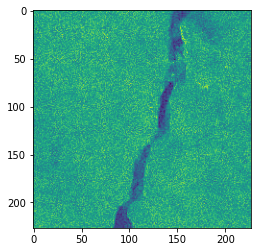

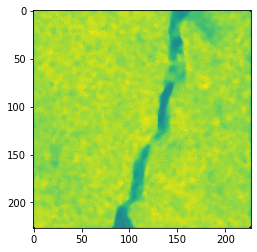

/content/THRESH/00010_bw.jpg
Time: 0.0122, True Level: 5.0000, Estimated Level: 17.0759
/content/THRESH/00010_bw.jpg


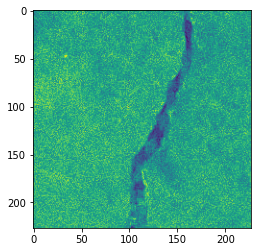

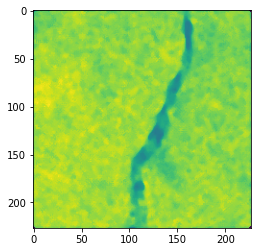

/content/THRESH/00022_bw.jpg
Time: 0.0157, True Level: 5.0000, Estimated Level: 16.3445
/content/THRESH/00022_bw.jpg


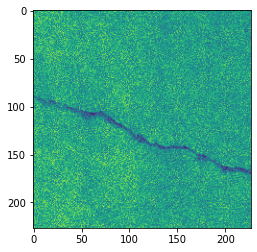

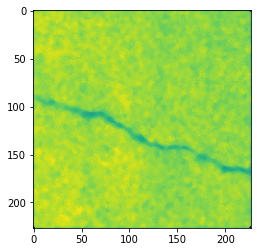

/content/THRESH/00019_bw.jpg
Time: 0.0089, True Level: 5.0000, Estimated Level: 17.2552
/content/THRESH/00019_bw.jpg


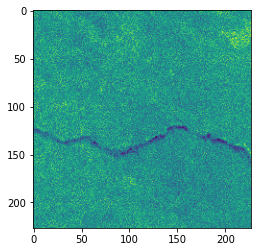

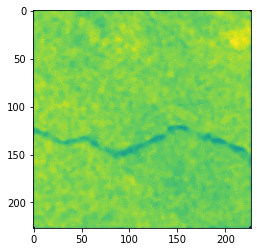

/content/THRESH/sandp1_26.jpg
Time: 0.0073, True Level: 5.0000, Estimated Level: 78.8521
/content/THRESH/sandp1_26.jpg


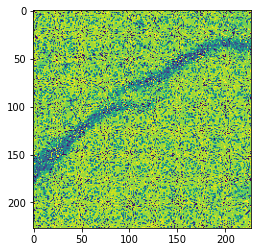

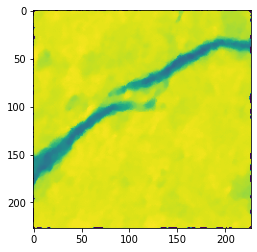

/content/THRESH/00002_bw.jpg
Time: 0.0132, True Level: 5.0000, Estimated Level: 17.1983
/content/THRESH/00002_bw.jpg


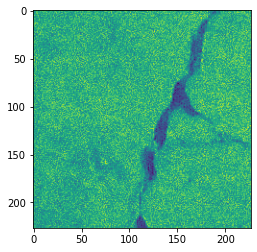

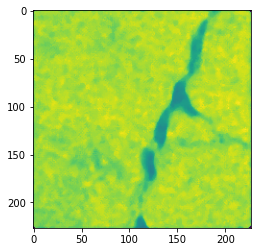

/content/THRESH/00011_bw.jpg
Time: 0.0091, True Level: 5.0000, Estimated Level: 16.3556
/content/THRESH/00011_bw.jpg


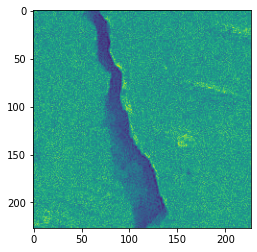

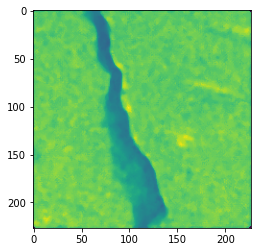

/content/THRESH/sandp1_20.jpg
Time: 0.0086, True Level: 5.0000, Estimated Level: 71.8278
/content/THRESH/sandp1_20.jpg


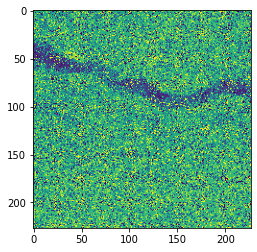

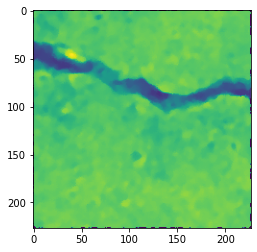

/content/THRESH/sandp1_11.jpg
Time: 0.0070, True Level: 5.0000, Estimated Level: 70.0618
/content/THRESH/sandp1_11.jpg


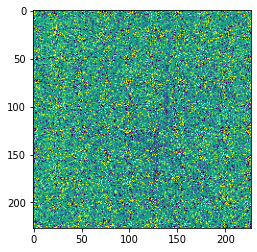

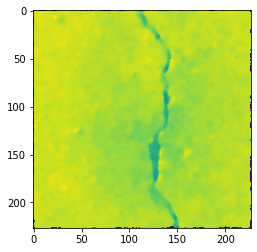

/content/THRESH/00013_bw.jpg
Time: 0.0079, True Level: 5.0000, Estimated Level: 16.7238
/content/THRESH/00013_bw.jpg


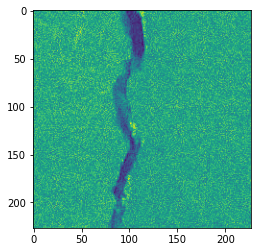

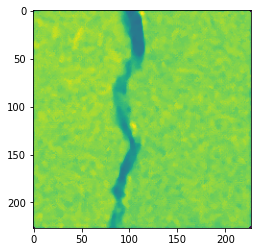

/content/THRESH/00009_bw.jpg
Time: 0.0080, True Level: 5.0000, Estimated Level: 16.8600
/content/THRESH/00009_bw.jpg


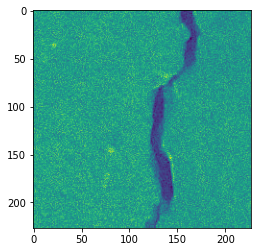

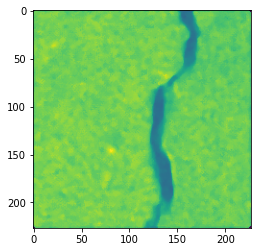

/content/THRESH/sandp1_19.jpg
Time: 0.0077, True Level: 5.0000, Estimated Level: 69.1393
/content/THRESH/sandp1_19.jpg


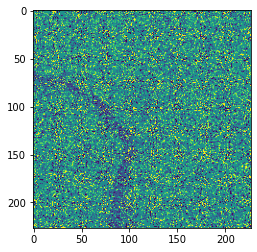

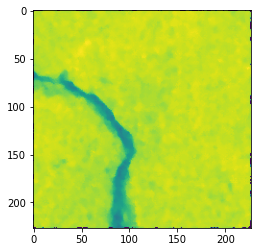

/content/THRESH/sandp1_23.jpg
Time: 0.0112, True Level: 5.0000, Estimated Level: 72.6424
/content/THRESH/sandp1_23.jpg


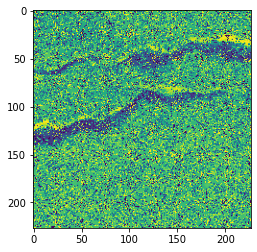

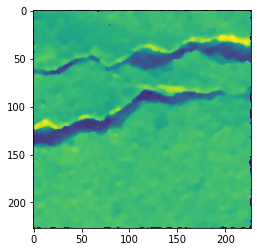

/content/THRESH/00025_bw.jpg
Time: 0.0129, True Level: 5.0000, Estimated Level: 16.6490
/content/THRESH/00025_bw.jpg


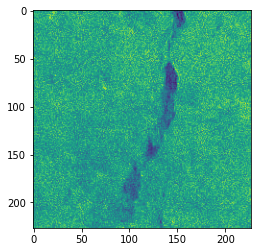

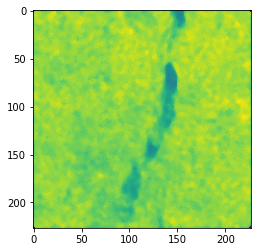

/content/THRESH/00021_bw.jpg
Time: 0.0152, True Level: 5.0000, Estimated Level: 16.9056
/content/THRESH/00021_bw.jpg


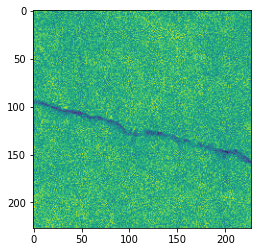

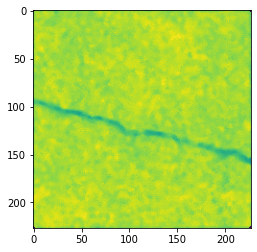

/content/THRESH/sandp1_13.jpg
Time: 0.0085, True Level: 5.0000, Estimated Level: 79.0547
/content/THRESH/sandp1_13.jpg


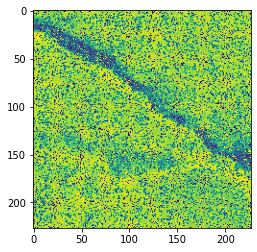

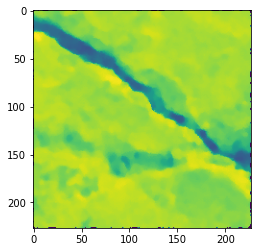

/content/THRESH/sandp1_10.jpg
Time: 0.0085, True Level: 5.0000, Estimated Level: 71.1911
/content/THRESH/sandp1_10.jpg


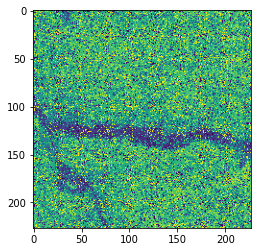

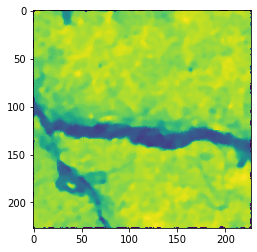

/content/THRESH/sandp1_28.jpg
Time: 0.0080, True Level: 5.0000, Estimated Level: 73.7621
/content/THRESH/sandp1_28.jpg


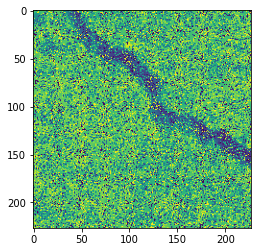

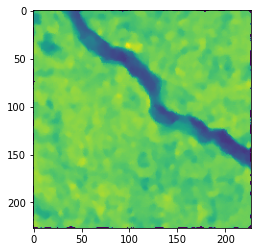

/content/THRESH/sandp1_12.jpg
Time: 0.0082, True Level: 5.0000, Estimated Level: 73.1101
/content/THRESH/sandp1_12.jpg


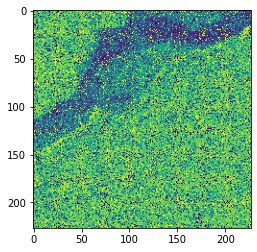

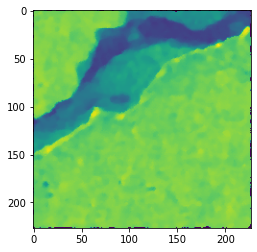

/content/THRESH/sandp1_2.jpg
Time: 0.0124, True Level: 5.0000, Estimated Level: 71.9963
/content/THRESH/sandp1_2.jpg


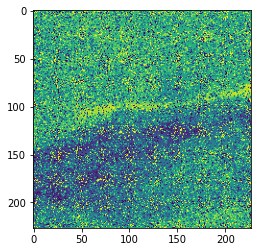

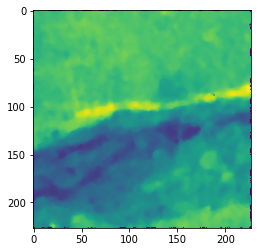

/content/THRESH/sandp1_9.jpg
Time: 0.0081, True Level: 5.0000, Estimated Level: 71.3331
/content/THRESH/sandp1_9.jpg


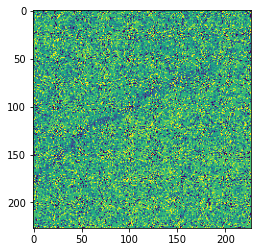

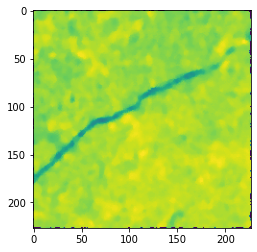

/content/THRESH/00028_bw.jpg
Time: 0.0116, True Level: 5.0000, Estimated Level: 20.8675
/content/THRESH/00028_bw.jpg


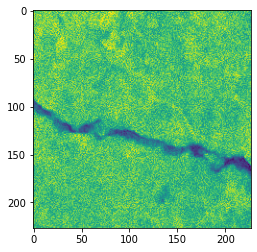

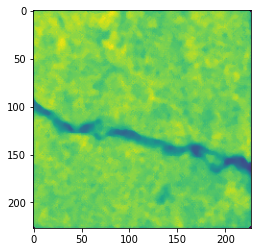

/content/THRESH/00008_bw.jpg
Time: 0.0069, True Level: 5.0000, Estimated Level: 16.0915
/content/THRESH/00008_bw.jpg


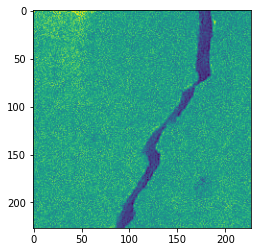

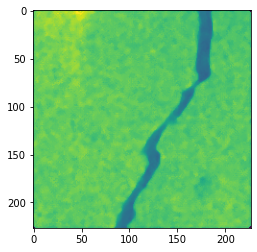

/content/THRESH/sandp1_18.jpg
Time: 0.0071, True Level: 5.0000, Estimated Level: 72.9743
/content/THRESH/sandp1_18.jpg


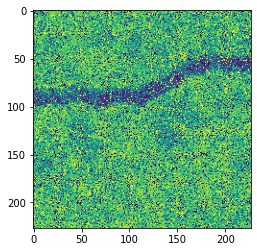

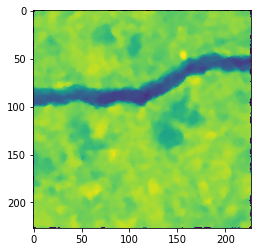

/content/THRESH/sandp1_22.jpg
Time: 0.0080, True Level: 5.0000, Estimated Level: 70.8848
/content/THRESH/sandp1_22.jpg


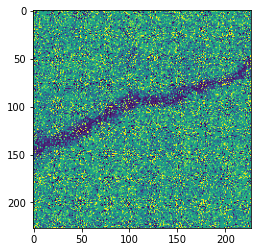

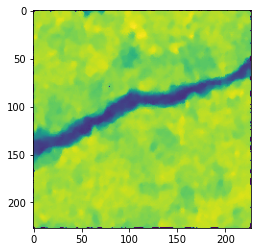

/content/THRESH/00018_bw.jpg
Time: 0.0079, True Level: 5.0000, Estimated Level: 15.6306
/content/THRESH/00018_bw.jpg


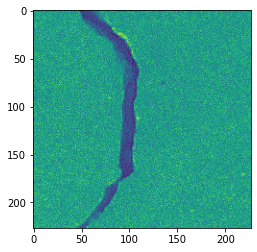

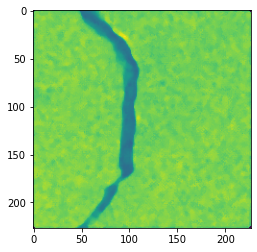

/content/THRESH/sandp1_3.jpg
Time: 0.0111, True Level: 5.0000, Estimated Level: 73.6600
/content/THRESH/sandp1_3.jpg


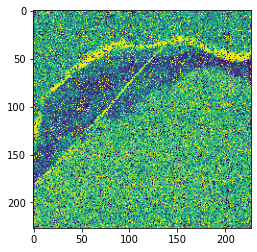

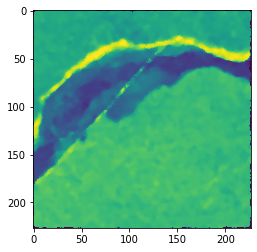

/content/THRESH/sandp1_24.jpg
Time: 0.0117, True Level: 5.0000, Estimated Level: 74.8582
/content/THRESH/sandp1_24.jpg


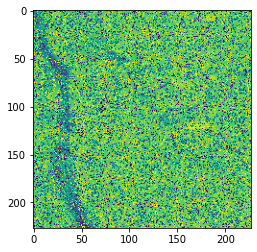

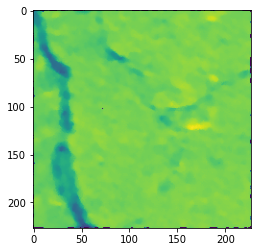

/content/THRESH/sandp1_5.jpg
Time: 0.0070, True Level: 5.0000, Estimated Level: 72.4805
/content/THRESH/sandp1_5.jpg


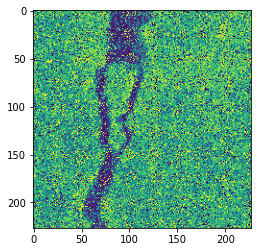

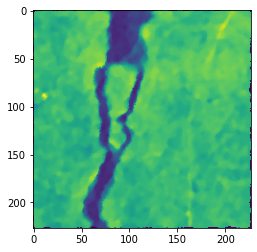

/content/THRESH/00003_bw.jpg
Time: 0.0071, True Level: 5.0000, Estimated Level: 15.3605
/content/THRESH/00003_bw.jpg


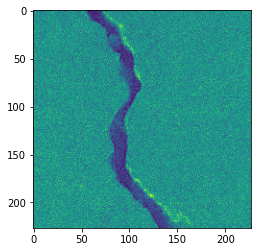

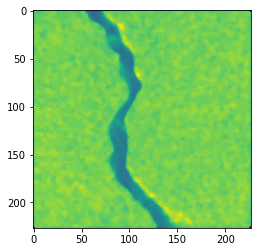

/content/THRESH/00026_bw.jpg
Time: 0.0073, True Level: 5.0000, Estimated Level: 21.5620
/content/THRESH/00026_bw.jpg


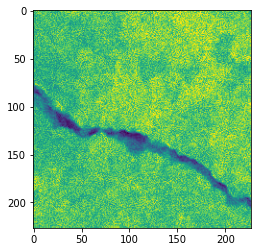

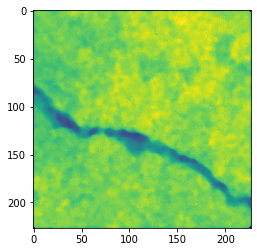

/content/THRESH/sandp1_1.jpg
Time: 0.0146, True Level: 5.0000, Estimated Level: 72.6232
/content/THRESH/sandp1_1.jpg


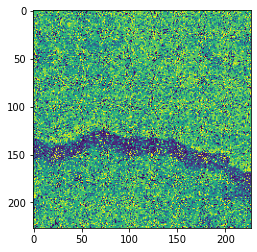

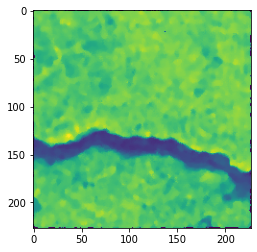

/content/THRESH/sandp1_8.jpg
Time: 0.0201, True Level: 5.0000, Estimated Level: 72.1399
/content/THRESH/sandp1_8.jpg


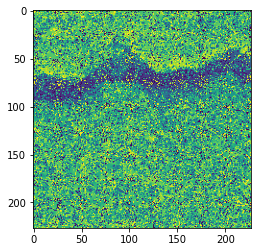

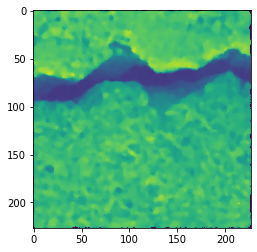

/content/THRESH/sandp1_4.jpg
Time: 0.0070, True Level: 5.0000, Estimated Level: 73.5402
/content/THRESH/sandp1_4.jpg


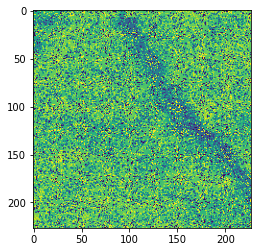

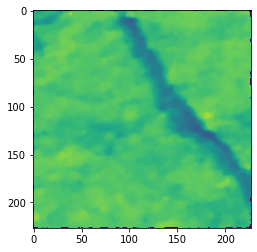

/content/THRESH/sandp1_27.jpg
Time: 0.0114, True Level: 5.0000, Estimated Level: 76.3199
/content/THRESH/sandp1_27.jpg


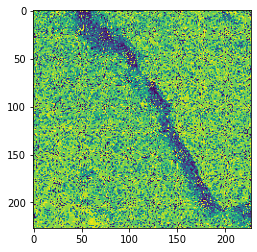

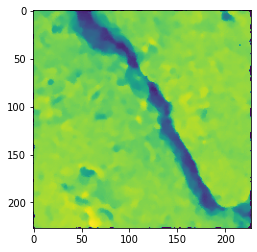

/content/THRESH/sandp1_17.jpg
Time: 0.0115, True Level: 5.0000, Estimated Level: 71.6234
/content/THRESH/sandp1_17.jpg


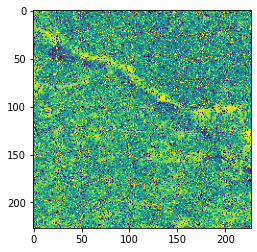

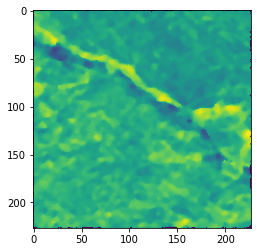

/content/THRESH/sandp1_15.jpg
Time: 0.0117, True Level: 5.0000, Estimated Level: 73.1195
/content/THRESH/sandp1_15.jpg


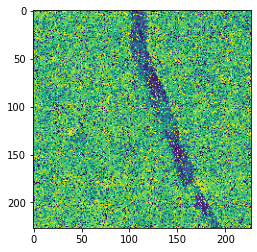

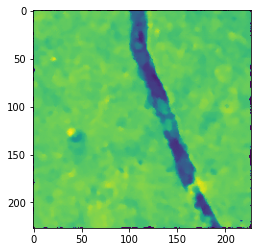

/content/THRESH/00017_bw.jpg
Time: 0.0117, True Level: 5.0000, Estimated Level: 16.6124
/content/THRESH/00017_bw.jpg


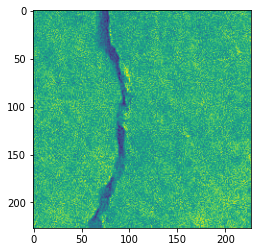

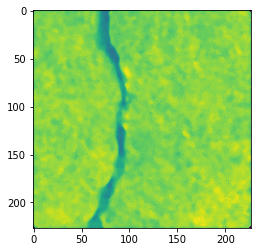

/content/THRESH/00004_bw.jpg
Time: 0.0081, True Level: 5.0000, Estimated Level: 15.3104
/content/THRESH/00004_bw.jpg


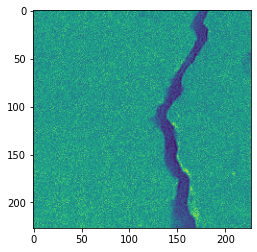

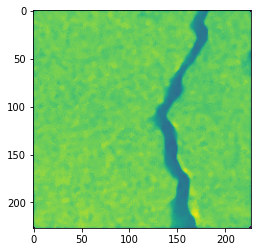

/content/THRESH/00012_bw.jpg
Time: 0.0070, True Level: 5.0000, Estimated Level: 15.4407
/content/THRESH/00012_bw.jpg


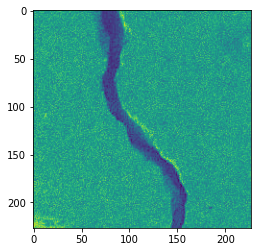

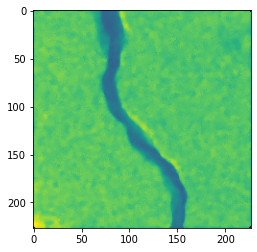

/content/THRESH/00024_bw.jpg
Time: 0.0081, True Level: 5.0000, Estimated Level: 13.8102
/content/THRESH/00024_bw.jpg


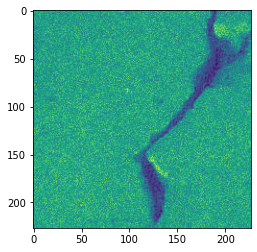

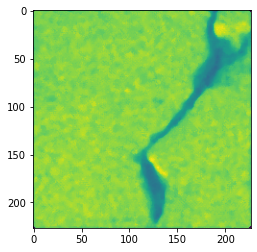

/content/THRESH/sandp1_14.jpg
Time: 0.0118, True Level: 5.0000, Estimated Level: 68.8329
/content/THRESH/sandp1_14.jpg


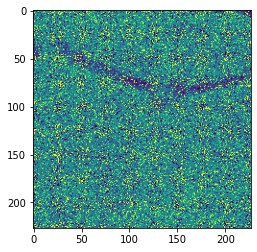

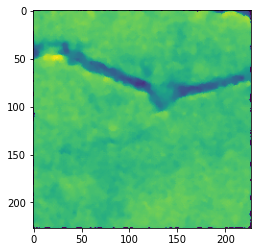

/content/THRESH/00023_bw.jpg
Time: 0.0118, True Level: 5.0000, Estimated Level: 14.8350
/content/THRESH/00023_bw.jpg


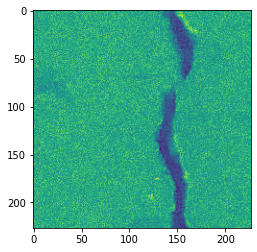

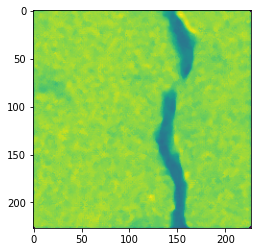

/content/THRESH/00001_bw.jpg
Time: 0.0128, True Level: 5.0000, Estimated Level: 13.8487
/content/THRESH/00001_bw.jpg


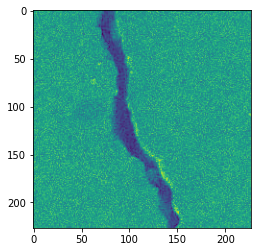

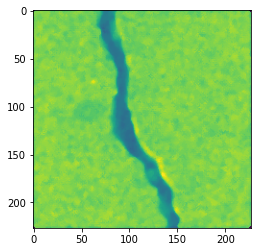

/content/THRESH/sandp1_21.jpg
Time: 0.0107, True Level: 5.0000, Estimated Level: 72.4604
/content/THRESH/sandp1_21.jpg


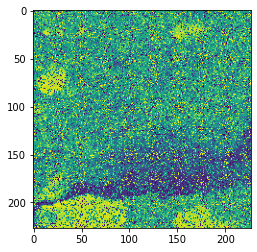

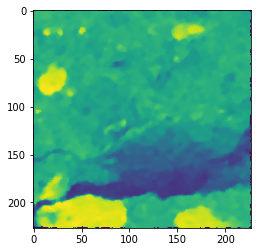

/content/THRESH/00020_bw.jpg
Time: 0.0128, True Level: 5.0000, Estimated Level: 16.7986
/content/THRESH/00020_bw.jpg


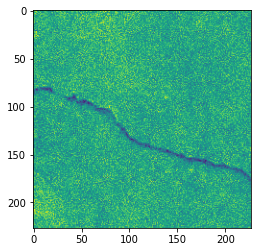

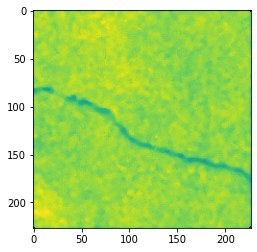

/content/THRESH/00015_bw.jpg
Time: 0.0133, True Level: 5.0000, Estimated Level: 16.2085
/content/THRESH/00015_bw.jpg


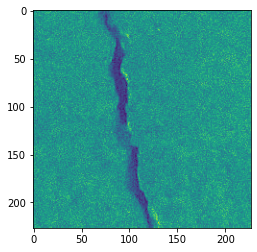

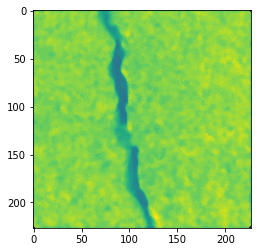

/content/THRESH/00027_bw.jpg
Time: 0.0123, True Level: 5.0000, Estimated Level: 21.7143
/content/THRESH/00027_bw.jpg


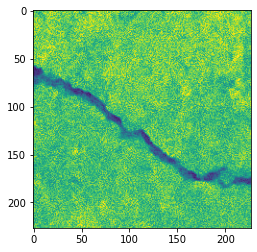

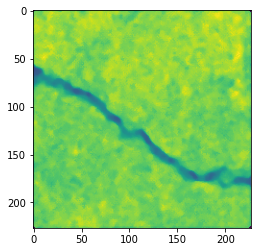

/content/THRESH/sandp1_7.jpg
Time: 0.0070, True Level: 5.0000, Estimated Level: 73.5908
/content/THRESH/sandp1_7.jpg


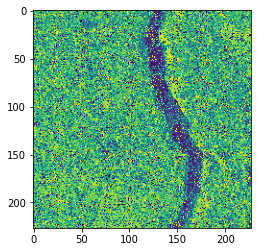

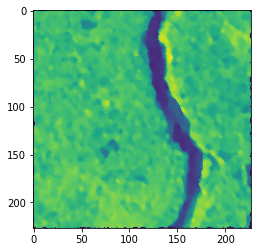

In [ ]:
path = '/content/THRESH/*.*'
img_number = 1
for file in glob.glob(path):
    print(file)
    img = cv2.imread(file,0)
    im = img_as_float(img)
    #noise_level = [5, 15, 20, 30, 40]
    noise_level = [5]
    for level in noise_level:
        sigma = level / 255

        im_noise = im + np.random.randn(*im.shape) * sigma

        start = time.time()
        est_level = noise_estimate(im_noise, 8)
        end = time.time()
        time_elapsed = end -start

        str_p = "Time: {0:.4f}, True Level: {1:6.4f}, Estimated Level: {2:6.4f}"
        if level-noise_level[0]>50:
          print(str_p.format(time_elapsed, level, est_level*255))
          print(file)
          img = cv2.imread(file,0)
          plt.imshow(img)
          plt.show()
          #median_using_cv2 = cv2.medianBlur(img, 3)

          from skimage.morphology import disk
          #Disk creates a circular structuring element, similar to a mask with specific radius
          median_using_skimage = median(img, disk(3), mode='constant', cval=0.0)
          plt.imshow(median_using_skimage)
          plt.show()
        else:
          print(str_p.format(time_elapsed, level, est_level*255))
          print(file)
          img = cv2.imread(file,0)
          plt.imshow(img)
          plt.show()
          #median_using_cv2 = cv2.medianBlur(img, 3)

          from skimage.morphology import disk
          #Disk creates a circular structuring element, similar to a mask with specific radius
          median_using_skimage = median(img, disk(3), mode='constant', cval=0.0)
          plt.imshow(median_using_skimage)
          plt.show()

        
        #cv2.imwrite("C:/Users/sonic/Downloads/all noises/Denoised_SP1/Negative/img"+str(img_number)+".jpg",median_using_cv2)
        #cv2.imwrite("C:/Users/sonic/Downloads/all noises/Denoised_SP2/neg/img"+str(img_number)+".jpg",median_using_skimage)
        img_number +=1
